<a href="https://colab.research.google.com/github/Amineharrabi/Waste-Classifier-using-Keras-and-CV2/blob/main/WasteManagerV1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


***Installing the libraries***

In [ ]:
!pip install opencv-python
!pip install tensorflow
!pip install keras==2.12.0
!pip install keras-cv==0.5.0
!pip install numpy==1.22.4
!pip install kaggle

***Importing the libraries***

In [ ]:
import keras_cv
import numpy as np
import cv2
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os
from tensorflow.python.keras.layers import Dense, Flatten
from pathlib import Path
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam




***Importing the Data From Kaggle***

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 1000 ~/.kaggle/kaggle.json
!kaggle datasets download -d arkadiyhacks/drinking-waste-classification
!unzip drinking-waste-classification

In [ ]:
import os

PATH = '/content/sample_data'

os.chdir(PATH)

***Model Creation***

In [ ]:
!mv /content/sample_data/Warp-C/train_crops/bottle/bottle-blue* /content/Bottle


/content/sample_data/Images_of_Waste/rawimgs/exemples/Exemple7.jpg


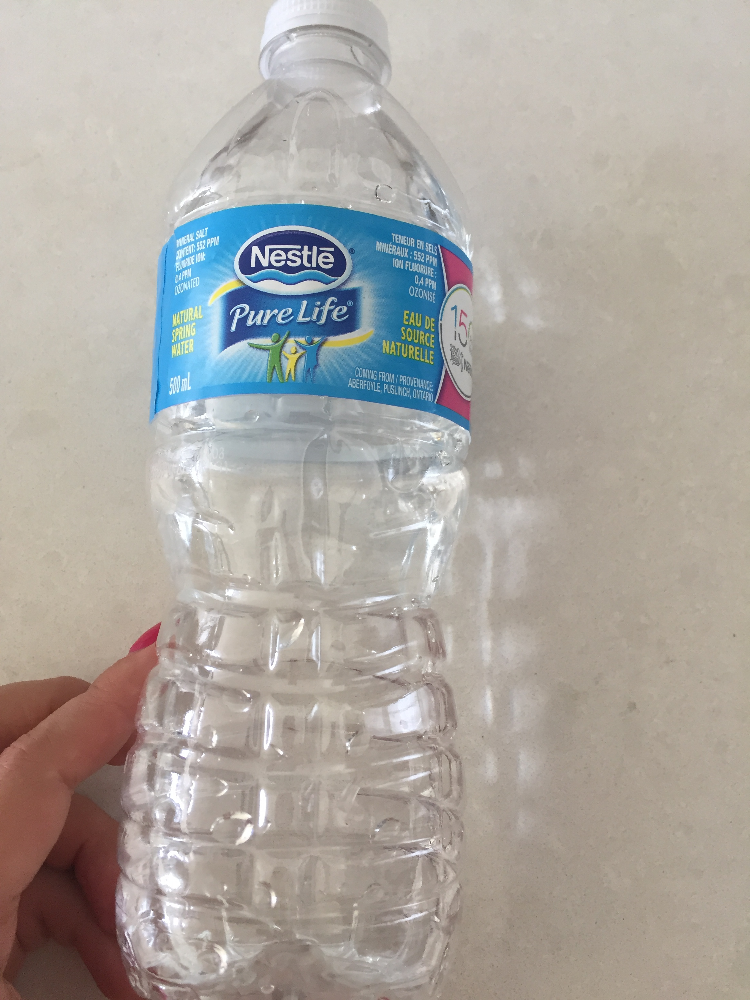

In [ ]:

model = keras_cv.models.RetinaNet.from_preset(
    "resnet50_v2_imagenet",
    num_classes=28,
    bounding_box_format="xywh",
)


i = 1

data_dir = Path('/content/sample_data/Images_of_Waste/rawimgs')
#trash = list(data_dir.glob('AluCan/*'))
trash = list(data_dir.glob('exemples/*'))

print(trash[i])

PIL.Image.open(str(trash[i]))



In [ ]:
img_height,img_width=180,180
batch_size=32
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4820 files belonging to 4 classes.
Using 3856 files for training.


In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4820 files belonging to 4 classes.
Using 964 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['AluCan', 'Glass', 'HDPEM', 'PET']


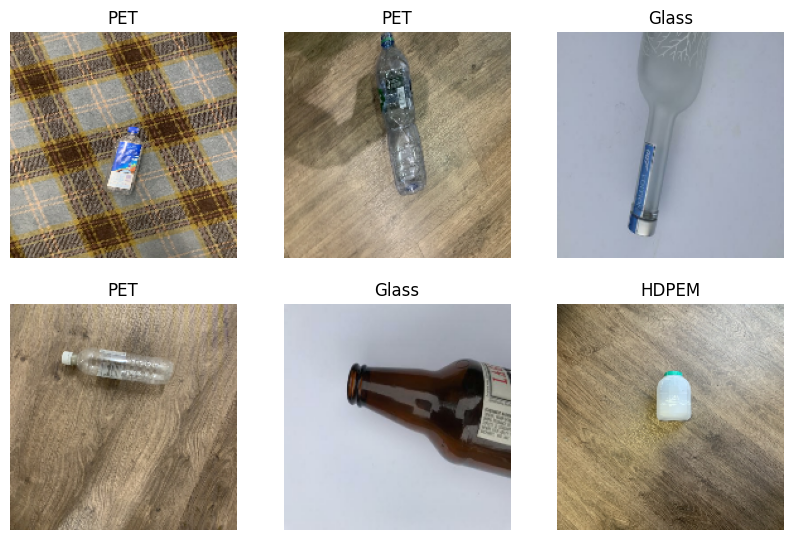

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(6):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

***Model Training***

In [ ]:
resnet_model = Sequential()

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   input_shape=(180,180,3),
                   pooling='avg',classes=4,
                   weights='imagenet')
for layer in pretrained_model.layers:
        layer.trainable=False

resnet_model.add(pretrained_model)
resnet_model.add(Flatten())
resnet_model.add(Dense(512, activation='relu'))
resnet_model.add(Dense(4,activation='softmax'))

In [ ]:
resnet_model.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 module_wrapper_22 (ModuleWr  (None, 2048)             0         
 apper)                                                          
                                                                 
 module_wrapper_23 (ModuleWr  (None, 254)              520446    
 apper)                                                          
                                                                 
 module_wrapper_24 (ModuleWr  (None, 4)                1020      
 apper)                                                          
                                                                 
Total params: 24,109,178
Trainable params: 521,466
Non-trainable params: 23,587,712
___________________________________

In [ ]:
epochs = 10
resnet_model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:

history = resnet_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Epoch 1/10


Exception ignored in: <function _xla_gc_callback at 0x7d9f17000d30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 101, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


121/121 [==============================] - 728s 5s/step - loss: 0.3351 - accuracy: 0.8766 - val_loss: 0.2012 - val_accuracy: 0.9274
Epoch 2/10
121/121 [==============================] - 638s 5s/step - loss: 0.0982 - accuracy: 0.9634 - val_loss: 0.1853 - val_accuracy: 0.9326
Epoch 3/10
121/121 [==============================] - 624s 5s/step - loss: 0.0606 - accuracy: 0.9798 - val_loss: 0.1022 - val_accuracy: 0.9616
Epoch 4/10
121/121 [==============================] - 622s 5s/step - loss: 0.0288 - accuracy: 0.9909 - val_loss: 0.0967 - val_accuracy: 0.9627
Epoch 5/10
121/121 [==============================] - 648s 5s/step - loss: 0.0102 - accuracy: 0.9979 - val_loss: 0.0856 - val_accuracy: 0.9689
Epoch 6/10
121/121 [==============================] - 637s 5s/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 0.0812 - val_accuracy: 0.9741
Epoch 7/10
121/121 [==============================] - 652s 5s/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.0815 - val_accuracy: 0.9751
Epoch 8/10

***Model Evaluation***

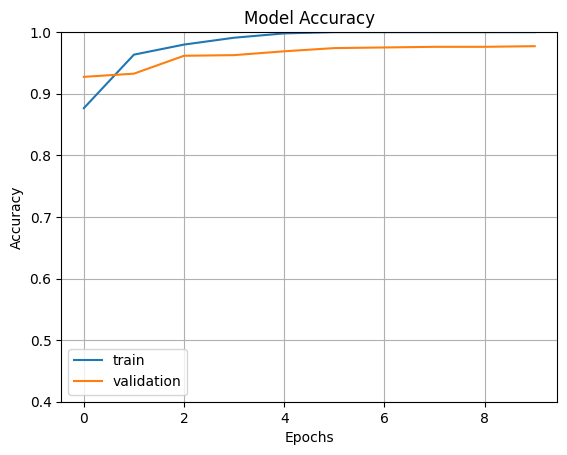

In [ ]:
fig1 = plt.gcf()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.axis(ymin=0.4,ymax=1)
plt.grid()
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

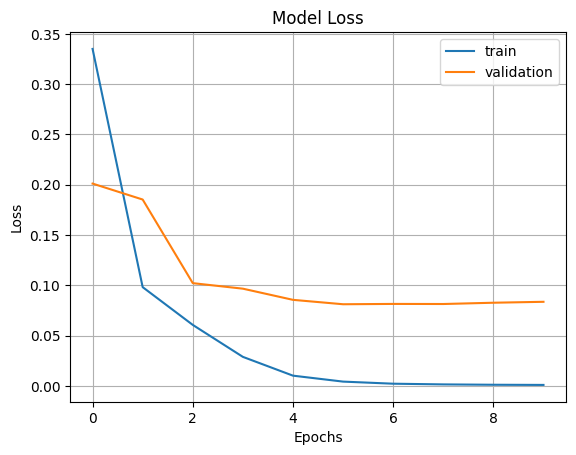

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.grid()
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

(1, 180, 180, 3)


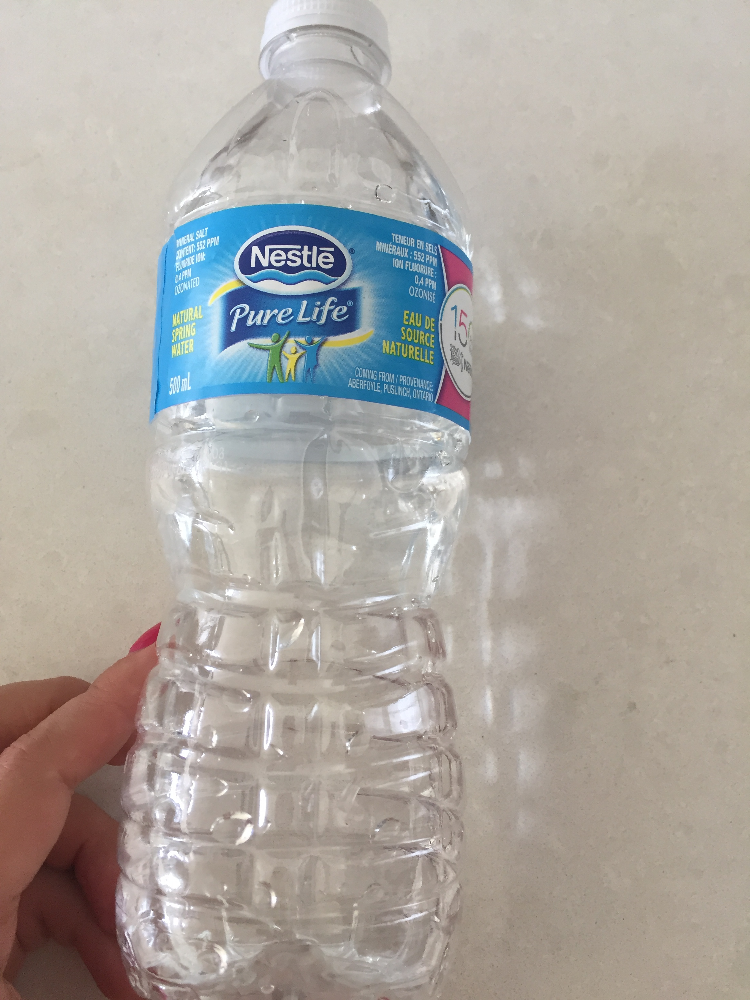

In [ ]:
import cv2
image=cv2.imread(str(trash[i]))
image_resized= cv2.resize(image, (img_height,img_width))
image=np.expand_dims(image_resized,axis=0)
print(image.shape)
PIL.Image.open(str(trash[i]))


***Custom predictions***

In [ ]:
pred=resnet_model.predict(image)
print(pred)


1/1 [==============================] - 0s 141ms/step
[[9.0158569e-10 1.7090199e-06 3.0092707e-08 9.9999821e-01]]


In [ ]:
output_class=class_names[np.argmax(pred)]
print("The predicted class is", output_class)

The predicted class is PET
